# trials with 3d shapes

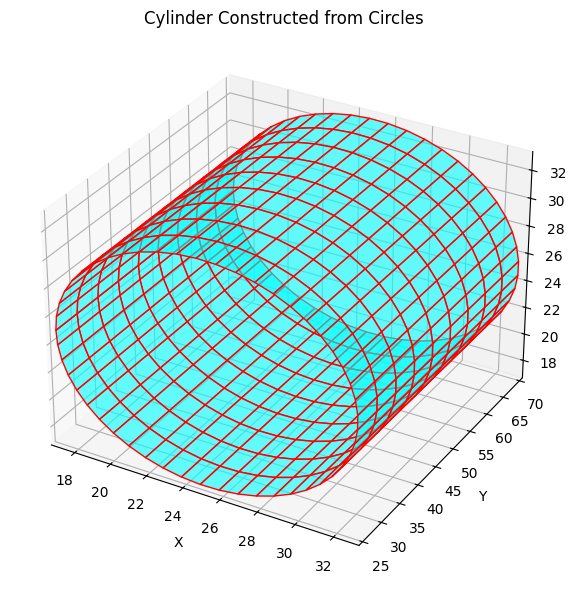

In [ ]:
from mpl_toolkits.mplot3d.art3d import Poly3DCollection

# Stack circles into an array of shape (N, M, 3)
circles_array = np.stack(circles, axis=0)  # shape: (N, M, 3)
N, M, _ = circles_array.shape

# Build faces by connecting consecutive circles
faces = []
for i in range(N - 1):
    for j in range(M):
        # Wrap around at the end of the circle
        next_j = (j + 1) % M
        # Each face is a quadrilateral connecting two adjacent circles
        face = [circles_array[i, j],
                circles_array[i+1, j],
                circles_array[i+1, next_j],
                circles_array[i, next_j]]
        faces.append(face)

# Create the 3D plot
fig = plt.figure(figsize=(8, 6))
ax = fig.add_subplot(111, projection='3d')

# Create a Poly3DCollection for the cylinder surface
poly = Poly3DCollection(faces, facecolors='cyan', edgecolors='r', alpha=0.6)
ax.add_collection3d(poly)

# Extract all points to determine the plot limits
all_points = circles_array.reshape(-1, 3)
x_limits = (np.min(all_points[:, 0]), np.max(all_points[:, 0]))
y_limits = (np.min(all_points[:, 1]), np.max(all_points[:, 1]))
z_limits = (np.min(all_points[:, 2]), np.max(all_points[:, 2]))

ax.set_xlim(x_limits)
ax.set_ylim(y_limits)
ax.set_zlim(z_limits)

ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')
plt.title('Cylinder Constructed from Circles')
plt.tight_layout()
plt.show()

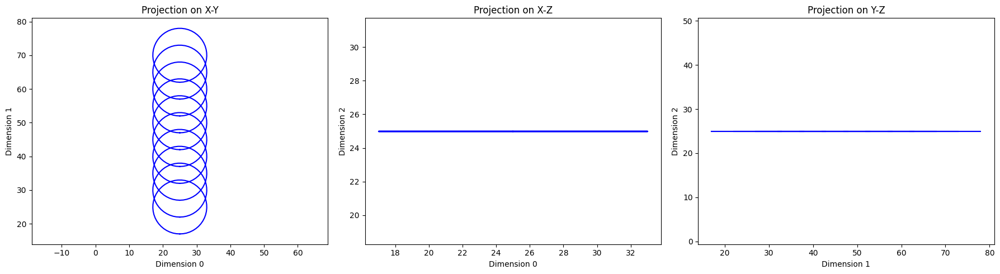

In [ ]:
dim_pairs = [(0, 1), (0, 2), (1, 2)]
titles = ["Projection on X-Y", "Projection on X-Z", "Projection on Y-Z"]

fig, axs = plt.subplots(1, 3, figsize=(18, 5))

for ax, (i, j), title in zip(axs, dim_pairs, titles):
    for circle in circles:
        # Project the circle points on the i-th and j-th dimensions.
        ax.plot(circle[:, i], circle[:, j], 'b-')
    ax.set_xlabel(f"Dimension {i}")
    ax.set_ylabel(f"Dimension {j}")
    ax.set_title(title)
    ax.axis("equal")

plt.tight_layout()
plt.show()

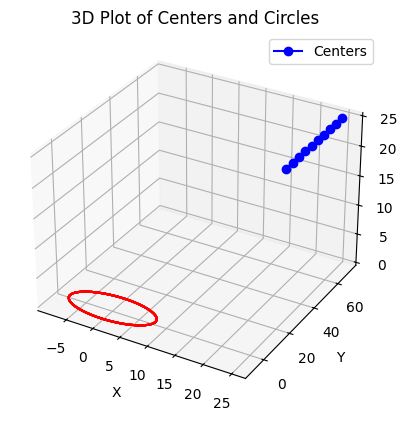

In [ ]:
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

# Extract x, y, z coordinates from centers
centers_x = centers[:, 0]
centers_y = centers[:, 1]
centers_z = centers[:, 2]

# Plot the centers
ax.plot(centers_x, centers_y, centers_z, 'bo-', label='Centers')

# Plot the circles
for circle in circles:
    ax.plot(circle[:, 0], circle[:, 1], circle[:, 2], 'r-')

# Set labels
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')
ax.set_title('3D Plot of Centers and Circles')
ax.legend()

plt.show()

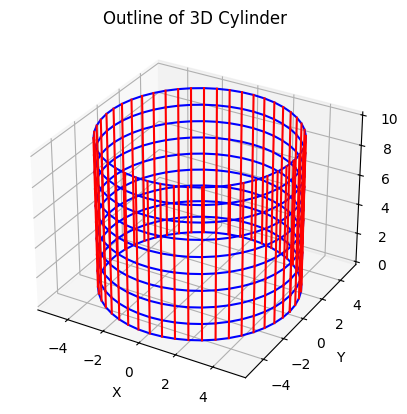

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Cylinder parameters
radius = 5
height = 10
num_points = 50  # Points per disc
num_layers = 10  # Number of disc layers

# Generate circle points in 3D space
theta = np.linspace(0, 2 * np.pi, num_points)
x = radius * np.cos(theta)
y = radius * np.sin(theta)

# Generate different layers along the z-axis
z_values = np.linspace(0, height, num_layers)

# Initialize figure
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

# Plot disc outlines
for z in z_values:
    ax.plot(x, y, z, 'b')  # Outline of each disc

# Connect corresponding points to form cylinder edges
for i in range(num_points):
    for j in range(num_layers - 1):
        ax.plot([x[i], x[i]], [y[i], y[i]], [z_values[j], z_values[j+1]], 'r')  # Vertical lines

# Labels
ax.set_xlabel("X")
ax.set_ylabel("Y")
ax.set_zlabel("Z")
plt.title("Outline of 3D Cylinder")

plt.show()

# start

In [ ]:
import torch as th
import torch
import numpy as np
from Codes.Losses.snake import Snake
from Codes.Losses.gradImSnake import cmptExtGrad
import torch.nn.functional as F
import networkx as nx
from Codes.Losses.gradImSnake import cmptGradIm, makeGaussEdgeFltr
from math import sin, pi
import trimesh
from scipy.spatial import KDTree
import matplotlib.pyplot as plt
import plotly.graph_objects as go
from mesh_to_sdf import mesh_to_sdf
from mpl_toolkits.mplot3d.art3d import Poly3DCollection

# rib snake start

In [6]:
class RibbonSnake(Snake):
    def __init__(self, graph, crop, stepsz, alpha, beta, gimgN, gimgW, step_type="original", ndims=2):
        super().__init__(graph, crop, stepsz, alpha, beta, ndims)
        self.w = th.ones(len(self.s), 1, dtype=th.float32) * 1.0  # Initial width
        self.step_type = step_type
        if self.s.is_cuda:
            self.s = self.s.cuda()
        
        self.gimgN = gimgN  # Gradient image (2 x H x W)
        self.gimgW = gimgW  # Gradient image (2 x H x W)

    def cuda(self):
        super().cuda()
        if self.gimgN is not None:
            self.gimgN = self.gimgN.cuda()
        if self.gimgW is not None:
            self.gimgW = self.gimgW.cuda()
    
    def _compute_normals_complex(self, pos_xy):
        if self.ndims == 2:
            k = pos_xy.size(0)
            normals = th.zeros_like(pos_xy)
            eps = 1e-8  # small constant to avoid division by zero

            # Helper function: rotate a 2D vector 90° (choose clockwise or counterclockwise)
            def perp(vec):
                return th.tensor([-vec[1], vec[0]], dtype=vec.dtype, device=vec.device)

            # First endpoint: use the edge to the next point
            if k >= 2:
                tang = pos_xy[1] - pos_xy[0]
                tang_norm = th.norm(tang) + eps
                tang = tang / tang_norm
                normals[0] = perp(tang)
            
            # Interior points
            for i in range(1, k-1):
                # Edge from previous point and edge to next point
                t1 = pos_xy[i] - pos_xy[i-1]
                t2 = pos_xy[i+1] - pos_xy[i]
                n1 = th.norm(t1) + eps
                n2 = th.norm(t2) + eps
                t1 = t1 / n1
                t2 = t2 / n2

                # Average the two normalized tangents.
                tangent = t1 + t2
                
                # In case the two directions nearly cancel (sharp corner), fall back to one of them.
                if th.norm(tangent) < 1e-5:
                    tangent = t1

                tangent = tangent / (th.norm(tangent) + eps)
                normals[i] = perp(tangent)
            
            # Last endpoint: use the edge from the previous point
            if k >= 2:
                tang = pos_xy[-1] - pos_xy[-2]
                tang = tang / (th.norm(tang) + eps)
                normals[-1] = perp(tang)
        
        elif self.ndims == 3:
            pos_xyz = pos_xy
            k = pos_xyz.size(0)
            normals = th.zeros_like(pos_xyz)
            eps = 1e-8  # small constant to avoid division by zero
            tangents = []
            # First endpoint: use the edge to the next point
            if k >= 2:
                tang = pos_xyz[1] - pos_xyz[0]
                tang_norm = th.norm(tang) + eps
                tang = tang / tang_norm
                tangents.append(tang)
                # Create an arbitrary normal in 3D by taking the cross product with a fixed vector
                arbitrary_vector = th.tensor([1.0, 0.0, 0.0], dtype=tang.dtype, device=tang.device)
                if th.allclose(tang, arbitrary_vector):
                    arbitrary_vector = th.tensor([0.0, 1.0, 0.0], dtype=tang.dtype, device=tang.device)
                normals[0] = th.cross(tang, arbitrary_vector)
                normals[0] = normals[0] / (th.norm(normals[0]) + eps)
            
            # Interior points
            for i in range(1, k-1):
                # Edge from previous point and edge to next point
                t1 = pos_xyz[i] - pos_xyz[i-1]
                t2 = pos_xyz[i+1] - pos_xyz[i]
                n1 = th.norm(t1) + eps
                n2 = th.norm(t2) + eps
                t1 = t1 / n1
                t2 = t2 / n2

                # Average the two normalized tangents.
                tangent = t1 + t2
                
                # In case the two directions nearly cancel (sharp corner), fall back to one of them.
                if th.norm(tangent) < 1e-5:
                    tangent = t1

                tangent = tangent / (th.norm(tangent) + eps)
                tangents.append(tangent)
                # Calculate the perpendicular for the tangent in 3D
                arbitrary_vector = th.tensor([1.0, 0.0, 0.0], dtype=tangent.dtype, device=tangent.device)
                if th.allclose(tangent, arbitrary_vector):
                    arbitrary_vector = th.tensor([0.0, 1.0, 0.0], dtype=tangent.dtype, device=tangent.device)
                normals[i] = th.cross(tangent, arbitrary_vector)
                normals[i] = normals[i] / (th.norm(normals[i]) + eps)
            
            # Last endpoint: use the edge from the previous point
            if k >= 2:
                tang = pos_xyz[-1] - pos_xyz[-2]
                tang = tang / (th.norm(tang) + eps)
                tangents.append(tang)
                arbitrary_vector = th.tensor([1.0, 0.0, 0.0], dtype=tangent.dtype, device=tangent.device)
                if th.allclose(tangent, arbitrary_vector):
                    arbitrary_vector = th.tensor([0.0, 1.0, 0.0], dtype=tangent.dtype, device=tangent.device)
                normals[-1] = th.cross(tang, arbitrary_vector)
                normals[-1] = normals[-1] / (th.norm(normals[-1]) + eps)

        return normals, tangents

    def step(self):
        if len(self.s) == 0:
            return
        super().step(cmptExtGrad(self.s, self.gimgN))
        return self.s
    
    def stiff_step(self, niter):
        if len(self.s) == 0:
            return

        # centerline positions and normals
        pos_xy = self.s
        normals = self._compute_normals_complex(pos_xy)
        
        # calculate edge positions
        v_L = pos_xy - self.w * normals / 2 # left outline for ribbon s
        v_R = pos_xy + self.w * normals / 2

        # Sample gradients at edges (2D only)
        grad_L = cmptExtGrad(v_L, self.gimgN) # grad values at left outline
        grad_R = cmptExtGrad(v_R, self.gimgN)

        grad_centerline = cmptExtGrad(pos_xy, self.gimgN)

        # Centerline gradient: sum of edge gradients
        grad_xy = (grad_L - grad_R) * normals

        grad_cent_average = th.mean(grad_centerline, dim=0, keepdim=True)
        grad_xy_average = th.mean(grad_xy, dim=0, keepdim=True)
        # update the centerline according to avergae gradient
        # just shifting the snake
        if niter < 500:
            self.s = self.s - self.stepsz * grad_cent_average
        else:
            self.s = self.s - self.stepsz * grad_xy_average
        #self.s = self.s - self.stepsz * grad_xy
        return self.s

    def comp_second_deriv(self):
        w = self.w
        n = w.shape[0]
        if n < 5:
            grad_norm = th.zeros_like(w)
            if n >= 3:
                grad_norm[1:-1] = (w[:-2] - 2 * w[1:-1] + w[2:])
            return grad_norm

        w_reshaped = w.view(1, 1, -1)
        kernel = th.tensor([1.0, -4.0, 6.0, -4.0, 1.0], dtype=w.dtype, device=w.device).view(1, 1, 5)

        grad_norm = F.conv1d(w_reshaped, kernel, padding=2)
        grad_norm = grad_norm
        return grad_norm.view(-1, 1)
    
    def step_widths(self):
        if len(self.s) == 0:
            return

        if self.ndims == 2:
            # centerline positions and normals
            pos_xy = self.s
            normals = self._compute_normals_complex(pos_xy)
            
            # calculate edge positions
            v_L = pos_xy - self.w * normals / 2 # left outline for ribbon s
            v_R = pos_xy + self.w * normals / 2

            # Sample gradients at edges (2D only)
            grad_L = cmptExtGrad(v_L, self.gimgW) # grad values at left outline
            grad_R = cmptExtGrad(v_R, self.gimgW)

            # Width gradient: projection of (grad_L - grad_R) onto normals
            grad_w = th.sum((-grad_L + grad_R) * normals, dim=1, keepdim=True)

            # smoothing for consecutive width values
            smooth_grad = th.zeros_like(grad_w)
            if len(self.s) > 1:
                smooth_grad[0] = (self.w[0] - self.w[1])
                smooth_grad[1:-1] = (2 * self.w[1:-1] - self.w[:-2] - self.w[2:])
                smooth_grad[-1] = (self.w[-1] - self.w[-2])

            norm_grad = self.comp_second_deriv()
            internal = norm_grad + smooth_grad
            # can also just use self.alpha but need to test to see which one is better (TODO)
            alpha = abs(grad_w) / abs(internal + 1e-8)

            total_grad = grad_w + alpha * internal
            # update width with separate internal energy (simplified version / can add different internal energies for wdith)
            # for example an internal energy that is dependent on width changes
            self.w = self.w - self.stepsz * total_grad
        
        # TODO: 3D case
        elif self.ndims == 3:
            pass

        return self.w

    def optim(self, niter):
        if self.step_type == "stiff":
            for i in range(niter):
                #self.step()
                if i < 300:
                    self.stiff_step(i)
                else:
                    self.step_widths()
        elif self.step_type == "original":
            for i in range(niter):
                if i < 50:
                    self.step()
                else:
                    self.step_widths()
        elif self.step_type == "combined":
            for i in range(niter):
                self.step()
                self.step_widths()
        return self.s
    
    def get_s(self):
        return self.s
    
    def get_w(self):
        return self.w
    
    def set_w(self, w):
        self.w = w

# 3D DIST

In [42]:
g = nx.Graph()
#widths = th.tensor([8.0]*10,dtype=th.float32)
widths = th.tensor([5.0,5.0,6.0,5.0,4.0,5.0,5.0,5.0,6.0,5.0], dtype=th.float32)
# az samplelayınca ve 
for i in range(25,75, 5):  # Start from 0
    g.add_node(i/5, pos=np.array([25, i, 25]))
    if i > 25:
        g.add_edge(i/5, i/5 - 1)
        
stepsz = 0.33
# if alpha is > 0, and sampling is not done enough, snake will collapse in itself
alpha = 0.0
beta = 0.0
crop = [slice(0, 200), slice(0, 200), slice(0, 200)]
ndims = 3

s = RibbonSnake(g, crop, stepsz, alpha, beta, None, None, ndims=ndims)
s.set_w(widths.clone().detach().view(-1, 1))

gra = s.getGraph()
nodes = [gra.nodes[n]['pos'] for n in gra.nodes()]
widths = s.get_w().flatten()
samples_to_widths = list(zip(nodes, widths))

norms_perf, tangents = s._compute_normals_complex(s.s)

centers = np.array([c for c, _ in samples_to_widths], dtype=np.float32)
widths = np.array([w for _, w in samples_to_widths], dtype=np.float32)
normals = np.array(norms_perf, dtype=np.float32)
tangents = np.array(tangents)

# circle for each node
def create_circle(center, tangent, radius, normal, num_points=50):
    u = np.cross(tangent, normal)
    u = u / np.linalg.norm(u)    

    angles = np.linspace(0, 2 * np.pi, num_points)
    circle_points = np.array([center + radius * (np.cos(a) * u + np.sin(a) * normal)
                              for a in angles])
    return circle_points

circles = []
num_centers = len(centers)

for i in range(num_centers):
    center = centers[i]
    radius = widths[i]
    tangent = tangents[i]
    normal = normals[i]
    
    circle = create_circle(center, tangent, radius, normal)
    circles.append(circle)

    

C:\Users\serta\AppData\Local\Temp\ipykernel_28744\337802632.py:29: DeprecationWarning:

__array__ implementation doesn't accept a copy keyword, so passing copy=False failed. __array__ must implement 'dtype' and 'copy' keyword arguments. To learn more, see the migration guide https://numpy.org/devdocs/numpy_2_0_migration_guide.html#adapting-to-changes-in-the-copy-keyword



In [43]:
def create_cylinder_mesh(circles):
    """ Generate a cylindrical mesh from a sequence of circles. """
    vertices = np.vstack(circles)
    faces = []

    num_points = circles[0].shape[0]  # Number of points in each circle
    num_circles = len(circles)

    for i in range(num_circles - 1):  # Iterate over adjacent circles
        for j in range(num_points): 
            next_j = (j + 1) % num_points  # Wrap around to form a closed loop

            # join all of the points in the circle
            v1 = i * num_points + j
            v2 = i * num_points + next_j
            v3 = (i + 1) * num_points + j
            v4 = (i + 1) * num_points + next_j

            faces.append([v1, v2, v3])  # First triangle
            faces.append([v2, v4, v3])  # Second triangle

    return np.array(vertices), np.array(faces)

vertices, faces = create_cylinder_mesh(circles)
mesh = trimesh.Trimesh(vertices=vertices, faces=faces)

mesh.show()

In [44]:
def create_hemisphere(center, radius, axis, u, v, num_phi=10, num_theta=50):
    center = np.asarray(center)
    axis = np.asarray(axis)
    u = np.asarray(u)
    v = np.asarray(v)
    
    vertices = []
    faces = []

    for i in range(num_phi + 1):
        phi = (np.pi / 2) * (i / num_phi)
        current_radius = radius * np.sin(phi)
        offset = radius * np.cos(phi) * axis
        for j in range(num_theta):
            theta = 2 * np.pi * (j / num_theta)
            point = center + offset + current_radius * (np.cos(theta) * u + np.sin(theta) * v)
            vertices.append(point)
    vertices = np.array(vertices)

    for i in range(num_phi):
        for j in range(num_theta):
            next_j = (j + 1) % num_theta
            a = i * num_theta + j
            b = i * num_theta + next_j
            c = (i + 1) * num_theta + j
            d = (i + 1) * num_theta + next_j
            faces.append([a, c, b])
            faces.append([b, c, d])
            
    return vertices, np.array(faces)

# Assume you already have:
#   - circles: a list of arrays (each of shape [num_points, 3]) for the cylinder cross-sections.
#   - centers: an array of center positions for each circle.
#   - widths: an array of radii for each circle.
#   - tangents and normals: arrays computed by s._compute_normals_complex(s.s)

# --- Create the hemispherical end-caps ---

# start hemisphere
start_center = centers[0]
start_radius = widths[0]
start_tangent = tangents[0]
start_normal = normals[0]
# Use the same in-plane basis as in your create_circle function:
start_u = np.cross(start_tangent, start_normal)
start_u = start_u / np.linalg.norm(start_u)
start_v = start_normal
# For the start cap, the hemisphere extends opposite to the snake’s tangent:
start_axis = -start_tangent / np.linalg.norm(start_tangent)
hemisphere_start_vertices, hemisphere_start_faces = create_hemisphere(start_center, start_radius, start_axis, start_u, start_v)

# For the end hemisphere (at the end of the cylinder):
end_center = centers[-1]
end_radius = widths[-1]
end_tangent = tangents[-1]
end_normal = normals[-1]
end_u = np.cross(end_tangent, end_normal)
end_u = end_u / np.linalg.norm(end_u)
end_v = end_normal
# For the end cap, the hemisphere extends in the direction of the tangent:
end_axis = end_tangent / np.linalg.norm(end_tangent)
hemisphere_end_vertices, hemisphere_end_faces = create_hemisphere(end_center, end_radius, end_axis, end_u, end_v)

# --- Create the cylinder mesh ---
cylinder_vertices, cylinder_faces = create_cylinder_mesh(circles)

# --- Combine the meshes ---
# We assume that the hemisphere equators exactly match the cylinder’s start and end circles.
# To combine, we offset the face indices appropriately.
hemisphere_start_faces_offset = hemisphere_start_faces + len(cylinder_vertices)
hemisphere_end_faces_offset = hemisphere_end_faces + len(cylinder_vertices) + len(hemisphere_start_vertices)

combined_vertices = np.vstack([cylinder_vertices, hemisphere_start_vertices, hemisphere_end_vertices])
combined_faces = np.vstack([cylinder_faces, hemisphere_start_faces_offset, hemisphere_end_faces_offset])

# Create a trimesh object and display it:
mesh = trimesh.Trimesh(vertices=combined_vertices, faces=combined_faces)
mesh.show()

In [45]:
if not mesh.is_watertight:
    print("Repairing mesh to be watertight...")
    mesh.fill_holes()
mesh.show()

Repairing mesh to be watertight...


In [ ]:
def compute_3d_distance_map(centers, widths, tangents, normals, grid_shape, voxel_size, origin, device='cuda'):
    """
    Compute a 3D signed distance map for a ribbon snake structure.
    
    Args:
        centers (np.ndarray): (N, 3) Centerline points.
        widths (np.ndarray): (N,) Radii at each center point.
        tangents (np.ndarray): (N, 3) Tangent vectors.
        normals (np.ndarray): (N, 3) Normal vectors.
        grid_shape (tuple): (nx, ny, nz) Grid dimensions.
        voxel_size (tuple): (dx, dy, dz) Voxel size.
        origin (tuple): (ox, oy, oz) Grid origin.
        device (str): Compute device ('cuda' or 'cpu').
    
    Returns:
        torch.Tensor: 3D signed distance map.
    """
    # convert inputs to PyTorch tensors
    centers_tensor = torch.tensor(centers, dtype=torch.float32, device=device)
    widths_tensor = torch.tensor(widths, dtype=torch.float32, device=device)
    tangents_tensor = torch.tensor(tangents, dtype=torch.float32, device=device)
    
    # generate grid points
    nx, ny, nz = grid_shape
    x = torch.linspace(origin[0], origin[0] + (nx-1)*voxel_size[0], nx, device=device)
    y = torch.linspace(origin[1], origin[1] + (ny-1)*voxel_size[1], ny, device=device)
    z = torch.linspace(origin[2], origin[2] + (nz-1)*voxel_size[2], nz, device=device)
    grid_x, grid_y, grid_z = torch.meshgrid(x, y, z, indexing='ij')
    points = torch.stack([grid_x.flatten(), grid_y.flatten(), grid_z.flatten()], dim=1)
    
    # precompute segments (N-1 segments)
    seg_start = centers_tensor[:-1]
    seg_end = centers_tensor[1:]
    seg_radii_start = widths_tensor[:-1] / 2
    seg_radii_end = widths_tensor[1:] / 2
    
    # vectorized distance calculation to all segments
    vec_seg = seg_end - seg_start  # (S, 3)
    seg_length = torch.norm(vec_seg, dim=1, keepdim=True)  # (S, 1)
    seg_dir = vec_seg / (seg_length + 1e-8)  # (S, 3)
    
    # calculate the distance of every voxel to every segment
    # expand points and segments for broadcasting
    points_exp = points.unsqueeze(1)
    seg_start_exp = seg_start.unsqueeze(0)
    seg_dir_exp = seg_dir.unsqueeze(0)
    seg_length_exp = seg_length.unsqueeze(0)
    
    # Vector from segment start to points
    vec_to_segment = points_exp - seg_start_exp  # (M, S, 3)
    
    # Projection along segment direction
    proj = torch.sum(vec_to_segment * seg_dir_exp, dim=2)  # (M, S)
    t = torch.clamp(proj, torch.tensor(0, device=device), seg_length_exp.squeeze(-1))  # (M, S)
    
    # Closest points on segments
    closest_points = seg_start_exp + t.unsqueeze(-1) * seg_dir_exp  # (M, S, 3)
    
    # Distance to closest points
    dist_to_axis = torch.norm(points_exp - closest_points, dim=2)  # (M, S)
    
    # Interpolate radii along segments
    t_ratio = t / (seg_length_exp.squeeze(-1) + 1e-8)
    radii_interp = seg_radii_start * (1 - t_ratio) + seg_radii_end * t_ratio  # (M, S)
    
    # Signed distance for segments
    signed_dist_segments = dist_to_axis - radii_interp  # (M, S)
    min_segment_dist, _ = torch.min(signed_dist_segments, dim=1)  # (M,)
    
    # Hemispherical end caps calculation
    def hemisphere_dist(center, radius, direction, points):
        vec = points - center
        sphere_dist = torch.norm(vec, dim=1) - radius
        direction = direction / torch.norm(direction)
        dot = torch.sum(vec * direction, dim=1)
        valid = dot >= 0
        return torch.where(valid, sphere_dist, torch.inf)
    
    # Start hemisphere
    start_center = centers_tensor[0]
    start_radius = widths_tensor[0] / 2
    start_dir = -tangents_tensor[0]
    dist_start = hemisphere_dist(start_center, start_radius, start_dir, points)
    
    # End hemisphere
    end_center = centers_tensor[-1]
    end_radius = widths_tensor[-1] / 2
    end_dir = tangents_tensor[-1]
    dist_end = hemisphere_dist(end_center, end_radius, end_dir, points)
    
    # Combine distances
    final_dist = torch.minimum(min_segment_dist, dist_start)
    final_dist = torch.minimum(final_dist, dist_end)
    
    return final_dist.reshape(grid_shape).cpu()

In [47]:
def calculate_grid_parameters(centers, widths, padding=10, voxel_resolution=1.0):
    """
    Auto-calculate grid parameters based on your ribbon snake geometry.
    
    centers: Your existing centers array from samples_to_widths
    widths: Your existing widths array
    padding: Extra space around the snake (in world units)
    voxel_resolution: Desired voxel size (same for all dimensions)
    """
    # Convert centers to numpy array if needed
    centers = np.array(centers)
    
    # Find bounding box
    min_coords = np.min(centers - widths[:, None]/2, axis=0) - padding
    max_coords = np.max(centers + widths[:, None]/2, axis=0) + padding
    
    # Calculate grid parameters
    grid_size = max_coords - min_coords
    grid_shape = tuple(np.ceil(grid_size / voxel_resolution).astype(int))
    
    return {
        'origin': min_coords,
        'voxel_size': (voxel_resolution, voxel_resolution, voxel_resolution),
        'grid_shape': grid_shape
    }

In [48]:
params = calculate_grid_parameters(centers, widths, padding=10, voxel_resolution=0.5)

In [49]:
distance_map = compute_3d_distance_map(
    centers, widths, tangents, normals,
    grid_shape=params['grid_shape'],
    voxel_size=params['voxel_size'],
    origin=params['origin']
)

In [50]:
def show_slices(distance_map):
    """Show orthogonal slices through the distance map"""
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    
    # Middle indices for each axis
    mid_x = distance_map.shape[0] // 2
    mid_y = distance_map.shape[1] // 2
    mid_z = distance_map.shape[2] // 2
    
    # Plot slices
    im0 = axes[0].imshow(distance_map[mid_x, :, :].T, cmap='coolwarm')
    axes[0].set_title('Axial Slice (X)')
    fig.colorbar(im0, ax=axes[0])
    
    im1 = axes[1].imshow(distance_map[:, mid_y, :].T, cmap='coolwarm')
    axes[1].set_title('Coronal Slice (Y)')
    fig.colorbar(im1, ax=axes[1])
    
    im2 = axes[2].imshow(distance_map[:, :, mid_z].T, cmap='coolwarm')
    axes[2].set_title('Sagittal Slice (Z)')
    fig.colorbar(im2, ax=axes[2])
    
    plt.show()

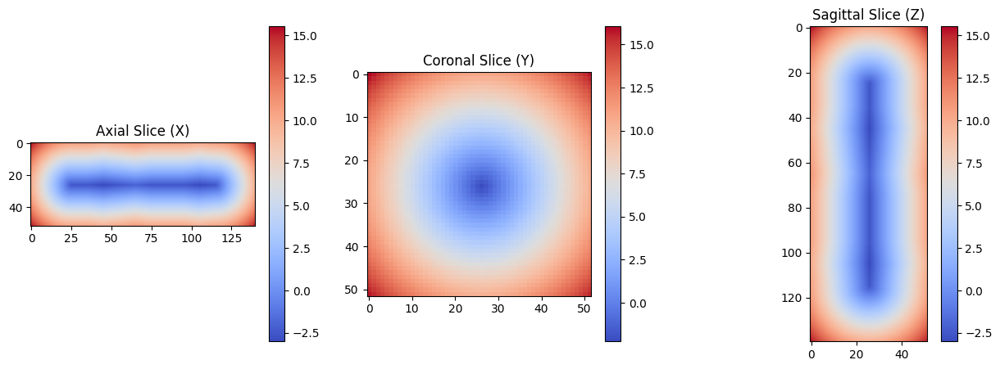

In [51]:
show_slices(distance_map)

# 3D DIST sine

In [20]:
widths = th.tensor([5.0]*50,dtype=th.float32)
g=nx.Graph()
for i in range(25,75):
    g.add_node(i,pos=np.array([sin(i*2*pi/50.0)*25+50,i, 25]))
    if i>25:
        g.add_edge(i,i-1)
        
stepsz = 0.33
# if alpha is > 0, and sampling is not done enough, snake will collapse in itself
alpha = 0.0
beta = 0.0
crop = [slice(0, 200), slice(0, 200), slice(0, 200)]
ndims = 3

s = RibbonSnake(g, crop, stepsz, alpha, beta, None, None, ndims=ndims)
s.set_w(widths.clone().detach().view(-1, 1))

gra = s.getGraph()
nodes = [gra.nodes[n]['pos'] for n in gra.nodes()]
widths = s.get_w().flatten()
samples_to_widths = list(zip(nodes, widths))

norms_perf, tangents = s._compute_normals_complex(s.s)

centers = np.array([c for c, _ in samples_to_widths], dtype=np.float32)
widths = np.array([w for _, w in samples_to_widths], dtype=np.float32)
normals = np.array(norms_perf, dtype=np.float32)
tangents = np.array(tangents)

def create_circle(center, tangent, radius, normal, num_points=50):
    u = np.cross(tangent, normal)
    u = u / np.linalg.norm(u)    

    angles = np.linspace(0, 2 * np.pi, num_points)
    circle_points = np.array([center + radius * (np.cos(a) * u + np.sin(a) * normal)
                              for a in angles])
    return circle_points

circles = []
num_centers = len(centers)

for i in range(num_centers):
    center = centers[i]
    radius = widths[i]
    tangent = tangents[i]
    normal = normals[i]
    
    circle = create_circle(center, tangent, radius, normal)
    circles.append(circle)

    

C:\Users\serta\AppData\Local\Temp\ipykernel_28744\3669916193.py:27: DeprecationWarning: __array__ implementation doesn't accept a copy keyword, so passing copy=False failed. __array__ must implement 'dtype' and 'copy' keyword arguments. To learn more, see the migration guide https://numpy.org/devdocs/numpy_2_0_migration_guide.html#adapting-to-changes-in-the-copy-keyword
  normals = np.array(norms_perf, dtype=np.float32)


In [21]:
def create_cylinder_mesh(circles):
    """ Generate a cylindrical mesh from a sequence of circles. """
    vertices = np.vstack(circles)
    faces = []

    num_points = circles[0].shape[0]  # Number of points in each circle
    num_circles = len(circles)

    for i in range(num_circles - 1):  # Iterate over adjacent circles
        for j in range(num_points):
            next_j = (j + 1) % num_points  # Wrap around to form a closed loop

            # Define indices for two triangles forming a quad
            v1 = i * num_points + j
            v2 = i * num_points + next_j
            v3 = (i + 1) * num_points + j
            v4 = (i + 1) * num_points + next_j

            faces.append([v1, v2, v3])  # First triangle
            faces.append([v2, v4, v3])  # Second triangle

    return np.array(vertices), np.array(faces)

# Generate mesh from computed circles
vertices, faces = create_cylinder_mesh(circles)

# Create a 3D Trimesh object
mesh = trimesh.Trimesh(vertices=vertices, faces=faces)

# Display the mesh
mesh.show()

In [24]:
def create_hemisphere(center, radius, axis, u, v, num_phi=10, num_theta=50):
    # Ensure inputs are NumPy arrays
    center = np.asarray(center)
    axis = np.asarray(axis)
    u = np.asarray(u)
    v = np.asarray(v)
    
    vertices = []
    faces = []
    # φ varies from 0 (pole) to π/2 (flat face)
    for i in range(num_phi + 1):
        phi = (np.pi / 2) * (i / num_phi)
        current_radius = radius * np.sin(phi)
        offset = radius * np.cos(phi) * axis
        for j in range(num_theta):
            theta = 2 * np.pi * (j / num_theta)
            point = center + offset + current_radius * (np.cos(theta) * u + np.sin(theta) * v)
            vertices.append(point)
    vertices = np.array(vertices)
    
    # Create faces by connecting adjacent rings:
    for i in range(num_phi):
        for j in range(num_theta):
            next_j = (j + 1) % num_theta
            a = i * num_theta + j
            b = i * num_theta + next_j
            c = (i + 1) * num_theta + j
            d = (i + 1) * num_theta + next_j
            faces.append([a, c, b])
            faces.append([b, c, d])
            
    return vertices, np.array(faces)

# Assume you already have:
#   - circles: a list of arrays (each of shape [num_points, 3]) for the cylinder cross-sections.
#   - centers: an array of center positions for each circle.
#   - widths: an array of radii for each circle.
#   - tangents and normals: arrays computed by s._compute_normals_complex(s.s)

# --- Create the hemispherical end-caps ---

# For the start hemisphere (at the beginning of the cylinder):
start_center = centers[0]
start_radius = widths[0]
start_tangent = tangents[0]
start_normal = normals[0]
# Use the same in-plane basis as in your create_circle function:
start_u = np.cross(start_tangent, start_normal)
start_u = start_u / np.linalg.norm(start_u)
start_v = start_normal
# For the start cap, the hemisphere extends opposite to the snake’s tangent:
start_axis = -start_tangent / np.linalg.norm(start_tangent)
hemisphere_start_vertices, hemisphere_start_faces = create_hemisphere(start_center, start_radius, start_axis, start_u, start_v)

# For the end hemisphere (at the end of the cylinder):
end_center = centers[-1]
end_radius = widths[-1]
end_tangent = tangents[-1]
end_normal = normals[-1]
end_u = np.cross(end_tangent, end_normal)
end_u = end_u / np.linalg.norm(end_u)
end_v = end_normal
# For the end cap, the hemisphere extends in the direction of the tangent:
end_axis = end_tangent / np.linalg.norm(end_tangent)
hemisphere_end_vertices, hemisphere_end_faces = create_hemisphere(end_center, end_radius, end_axis, end_u, end_v)

# --- Create the cylinder mesh ---
cylinder_vertices, cylinder_faces = create_cylinder_mesh(circles)

# --- Combine the meshes ---
# We assume that the hemisphere equators exactly match the cylinder’s start and end circles.
# To combine, we offset the face indices appropriately.
hemisphere_start_faces_offset = hemisphere_start_faces + len(cylinder_vertices)
hemisphere_end_faces_offset = hemisphere_end_faces + len(cylinder_vertices) + len(hemisphere_start_vertices)

combined_vertices = np.vstack([cylinder_vertices, hemisphere_start_vertices, hemisphere_end_vertices])
combined_faces = np.vstack([cylinder_faces, hemisphere_start_faces_offset, hemisphere_end_faces_offset])

# Create a trimesh object and display it:
mesh = trimesh.Trimesh(vertices=combined_vertices, faces=combined_faces)
if not mesh.is_watertight:
    print("Repairing mesh to be watertight...")
    mesh.fill_holes()
mesh.show()

Repairing mesh to be watertight...


In [25]:
def compute_3d_distance_map(centers, widths, tangents, normals, grid_shape, voxel_size, origin, device='cuda'):
    """
    Compute a 3D signed distance map for a ribbon snake structure.
    
    Args:
        centers (np.ndarray): (N, 3) Centerline points.
        widths (np.ndarray): (N,) Radii at each center point.
        tangents (np.ndarray): (N, 3) Tangent vectors.
        normals (np.ndarray): (N, 3) Normal vectors.
        grid_shape (tuple): (nx, ny, nz) Grid dimensions.
        voxel_size (tuple): (dx, dy, dz) Voxel size.
        origin (tuple): (ox, oy, oz) Grid origin.
        device (str): Compute device ('cuda' or 'cpu').
    
    Returns:
        torch.Tensor: 3D signed distance map.
    """
    # Convert inputs to PyTorch tensors
    centers_tensor = torch.tensor(centers, dtype=torch.float32, device=device)
    widths_tensor = torch.tensor(widths, dtype=torch.float32, device=device)
    tangents_tensor = torch.tensor(tangents, dtype=torch.float32, device=device)
    
    # Generate grid points
    nx, ny, nz = grid_shape
    x = torch.linspace(origin[0], origin[0] + (nx-1)*voxel_size[0], nx, device=device)
    y = torch.linspace(origin[1], origin[1] + (ny-1)*voxel_size[1], ny, device=device)
    z = torch.linspace(origin[2], origin[2] + (nz-1)*voxel_size[2], nz, device=device)
    grid_x, grid_y, grid_z = torch.meshgrid(x, y, z, indexing='ij')
    points = torch.stack([grid_x.flatten(), grid_y.flatten(), grid_z.flatten()], dim=1)  # (M, 3)
    
    # Precompute segments (N-1 segments)
    seg_start = centers_tensor[:-1]
    seg_end = centers_tensor[1:]
    seg_radii_start = widths_tensor[:-1] / 2
    seg_radii_end = widths_tensor[1:] / 2
    
    # Vectorized distance calculation to all segments
    vec_seg = seg_end - seg_start  # (S, 3)
    seg_length = torch.norm(vec_seg, dim=1, keepdim=True)  # (S, 1)
    seg_dir = vec_seg / (seg_length + 1e-8)  # (S, 3)
    
    # Expand points and segments for broadcasting
    points_exp = points.unsqueeze(1)  # (M, 1, 3)
    seg_start_exp = seg_start.unsqueeze(0)  # (1, S, 3)
    seg_dir_exp = seg_dir.unsqueeze(0)  # (1, S, 3)
    seg_length_exp = seg_length.unsqueeze(0)  # (1, S, 1)
    
    # Vector from segment start to points
    vec_to_segment = points_exp - seg_start_exp  # (M, S, 3)
    
    # Projection along segment direction
    proj = torch.sum(vec_to_segment * seg_dir_exp, dim=2)  # (M, S)
    t = torch.clamp(proj, torch.tensor(0, device=device), seg_length_exp.squeeze(-1))  # (M, S)
    
    # Closest points on segments
    closest_points = seg_start_exp + t.unsqueeze(-1) * seg_dir_exp  # (M, S, 3)
    
    # Distance to closest points
    dist_to_axis = torch.norm(points_exp - closest_points, dim=2)  # (M, S)
    
    # Interpolate radii along segments
    t_ratio = t / (seg_length_exp.squeeze(-1) + 1e-8)
    radii_interp = seg_radii_start * (1 - t_ratio) + seg_radii_end * t_ratio  # (M, S)
    
    # Signed distance for segments
    signed_dist_segments = dist_to_axis - radii_interp  # (M, S)
    min_segment_dist, _ = torch.min(signed_dist_segments, dim=1)  # (M,)
    
    # Hemispherical end caps calculation
    def hemisphere_dist(center, radius, direction, points):
        vec = points - center
        sphere_dist = torch.norm(vec, dim=1) - radius
        direction = direction / torch.norm(direction)
        dot = torch.sum(vec * direction, dim=1)
        valid = dot >= 0
        return torch.where(valid, sphere_dist, torch.inf)
    
    # Start hemisphere
    start_center = centers_tensor[0]
    start_radius = widths_tensor[0] / 2
    start_dir = -tangents_tensor[0]
    dist_start = hemisphere_dist(start_center, start_radius, start_dir, points)
    
    # End hemisphere
    end_center = centers_tensor[-1]
    end_radius = widths_tensor[-1] / 2
    end_dir = tangents_tensor[-1]
    dist_end = hemisphere_dist(end_center, end_radius, end_dir, points)
    
    # Combine distances
    final_dist = torch.minimum(min_segment_dist, dist_start)
    final_dist = torch.minimum(final_dist, dist_end)
    
    return final_dist.reshape(grid_shape).cpu()

In [ ]:
def calculate_grid_parameters(centers, widths, padding=10, voxel_resolution=1.0):
    """
    Auto-calculate grid parameters based on your ribbon snake geometry.
    
    centers: Your existing centers array from samples_to_widths
    widths: Your existing widths array
    padding: Extra space around the snake (in world units)
    voxel_resolution: Desired voxel size (same for all dimensions)
    """
    centers = np.array(centers)
    
    min_coords = np.min(centers - widths[:, None]/2, axis=0) - padding
    max_coords = np.max(centers + widths[:, None]/2, axis=0) + padding
    
    grid_size = max_coords - min_coords
    grid_shape = tuple(np.ceil(grid_size / voxel_resolution).astype(int))
    
    return {
        'origin': min_coords,
        'voxel_size': (voxel_resolution, voxel_resolution, voxel_resolution),
        'grid_shape': grid_shape
    }

In [27]:
params = calculate_grid_parameters(centers, widths, padding=10, voxel_resolution=0.5)

In [28]:
distance_map = compute_3d_distance_map(
    centers, widths, tangents, normals,
    grid_shape=params['grid_shape'],
    voxel_size=params['voxel_size'],
    origin=params['origin']
)

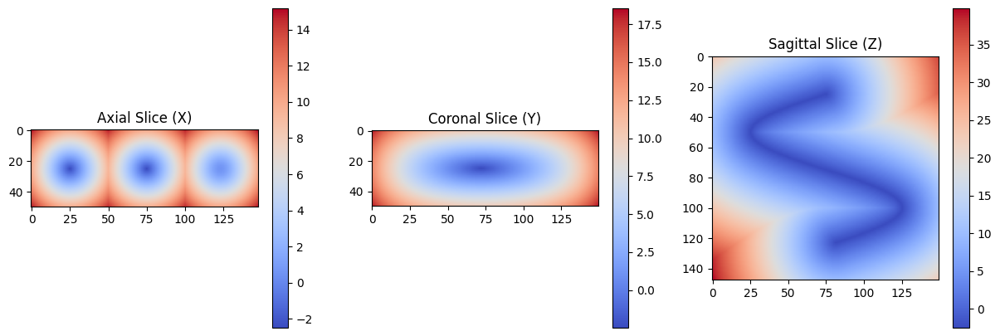

In [29]:
show_slices(distance_map)

In [30]:
def plot_3d_isosurface(distance_map, isovalue=0):
    """Interactive 3D surface plot showing the zero level set"""
    x, y, z = np.mgrid[:distance_map.shape[0], 
                     :distance_map.shape[1],
                     :distance_map.shape[2]]
    
    fig = go.Figure(data=go.Isosurface(
        x=x.flatten(),
        y=y.flatten(),
        z=z.flatten(),
        value=distance_map.flatten(),
        isomin=isovalue,
        isomax=isovalue,
        caps=dict(x_show=False, y_show=False, z_show=False)
    ))
    
    fig.update_layout(scene=dict(
        xaxis_title='X',
        yaxis_title='Y',
        zaxis_title='Z'),
        margin=dict(t=0, b=0))
    
    fig.show()

In [31]:
plot_3d_isosurface(distance_map)